In [175]:
!pip install shap
!pip install lime
!pip install imbalanced-learn

In [176]:
import pandas as pd
from pathlib import Path
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

from sklearn import preprocessing
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier
from sklearn.utils import shuffle

from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from sklearn.model_selection import GridSearchCV, ShuffleSplit, cross_validate
import xgboost

from sklearn.metrics import accuracy_score, classification_report,confusion_matrix

import lime
from lime import lime_tabular
import shap

import imblearn
from imblearn.over_sampling import SMOTE

In [177]:
# Set the path to the CSV containing the dataset to train on.
csv_path = 'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data'

# Set the column names for the columns in the CSV. If the CSV's first line is a header line containing
# the column names, then set this to None.
csv_columns = [
  "Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital-Status",
  "Occupation", "Relationship", "Race", "Sex", "Capital-Gain", "Capital-Loss",
  "Hours-per-week", "Country", "Over-50K"]

# Read the dataset from the provided CSV and print out information about it.
df = pd.read_csv(csv_path, names=csv_columns, skipinitialspace=True)

df

,Age,Workclass,fnlwgt,Education,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country,Over-50K
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [178]:
# rename over-50k to Target
df = df.rename(columns={"Over-50K": "Target"})

In [179]:
# train and test split with labels
train, test = train_test_split(df, test_size=0.2, random_state=42, shuffle=True)
train.head()

,Age,Workclass,fnlwgt,Education,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country,Target
5514,33,Local-gov,198183,Bachelors,13,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,50,United-States,>50K
19777,36,Private,86459,Assoc-voc,11,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,1887,50,United-States,>50K
10781,58,Self-emp-not-inc,203039,9th,5,Separated,Craft-repair,Not-in-family,White,Male,0,0,40,United-States,<=50K
32240,21,Private,180190,Assoc-voc,11,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,46,United-States,<=50K
9876,27,Private,279872,Some-college,10,Divorced,Other-service,Not-in-family,White,Male,0,0,40,United-States,<=50K


In [180]:
print('Number of rows in training set:', train.shape[0])
print('Number of columns in training set:', train.shape[1] - 1)

print('Number of rows in test set:', test.shape[0])
print('Number of columns in test set:', test.shape[1] - 1)

Number of rows in training set: 26048
Number of columns in training set: 14
Number of rows in test set: 6513
Number of columns in test set: 14


In [181]:
# missing value percentage train
(train.isnull().mean()*100).round(3)

Age               0.0
Workclass         0.0
fnlwgt            0.0
Education         0.0
Education-Num     0.0
Marital-Status    0.0
Occupation        0.0
Relationship      0.0
Race              0.0
Sex               0.0
Capital-Gain      0.0
Capital-Loss      0.0
Hours-per-week    0.0
Country           0.0
Target            0.0
dtype: float64

In [182]:
# missing value percentage test
(test.isnull().mean()*100).round(3)

Age               0.0
Workclass         0.0
fnlwgt            0.0
Education         0.0
Education-Num     0.0
Marital-Status    0.0
Occupation        0.0
Relationship      0.0
Race              0.0
Sex               0.0
Capital-Gain      0.0
Capital-Loss      0.0
Hours-per-week    0.0
Country           0.0
Target            0.0
dtype: float64

In [183]:
train.describe()

,Age,fnlwgt,Education-Num,Capital-Gain,Capital-Loss,Hours-per-week
count,26048.000000,2.604800e+04,26048.000000,26048.000000,26048.000000,26048.000000
mean,38.576513,1.897592e+05,10.080544,1053.617437,87.988828,40.388552
std,13.642904,1.052329e+05,2.575202,7230.800656,403.629787,12.331139
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.179630e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.782635e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370065e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [184]:
pd.crosstab(train.Race, train.Target, margins=True).style.background_gradient(cmap='autumn_r')

Target,<=50K,>50K,All
Race,,,
Amer-Indian-Eskimo,214,26,240
Asian-Pac-Islander,632,214,846
Black,2203,322,2525
Other,197,19,216
White,16532,5689,22221
All,19778,6270,26048


In [185]:
# Percentages of positive outcome
Amer_Indian_Eskimo = (26/240)*100
Asian_Pac_Islander = (214/846)*100
Black = (322/2525)*100
Other = (19/216)*100
White = (5689/22221)*100
All = (6270/26048)*100
print(f"Percentage of >50K for Amer-Indian-Eskimo: {Amer_Indian_Eskimo:.2f}%")
print(f"Percentage of >50K for Asian-Pac-Islander: {Asian_Pac_Islander:.2f}%")
print(f"Percentage of >50K for Black: {Black:.2f}%")
print(f"Percentage of >50K for Other: {Other:.2f}%")
print(f"Percentage of >50K for White: {White:.2f}%")
print(f"Percentage of >50K for All: {All:.2f}%")

Percentage of >50K for Amer-Indian-Eskimo: 10.83%
Percentage of >50K for Asian-Pac-Islander: 25.30%
Percentage of >50K for Black: 12.75%
Percentage of >50K for Other: 8.80%
Percentage of >50K for White: 25.60%
Percentage of >50K for All: 24.07%


In [186]:
label_encoder = preprocessing.LabelEncoder()

train['Target']= label_encoder.fit_transform(train['Target'])

In [187]:
train_dummy = pd.get_dummies(train,columns = ['Marital-Status','Occupation','Relationship','Workclass','Country','Race','Sex'],drop_first=False)

In [188]:
train = shuffle(train)
# Load data and split
X = train_dummy.drop(['Target','Education'],axis =1)
y = train_dummy['Target'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

# Feature Selection

In [189]:
rf_selector = RandomForestClassifier(n_estimators=1000,random_state=0, n_jobs=-1)
rf_selector.fit(X_train,y_train)

RandomForestClassifier(n_estimators=1000, n_jobs=-1, random_state=0)

In [190]:
features = X_train.columns
for feature in zip(features, rf_selector.feature_importances_):
    print(feature)

('Age', 0.14704379431406947)
('fnlwgt', 0.1584568966530117)
('Education-Num', 0.11078508130564253)
('Capital-Gain', 0.09662135985263352)
('Capital-Loss', 0.031680262337573616)
('Hours-per-week', 0.08421406772548641)
('Marital-Status_Divorced', 0.006328120978800775)
('Marital-Status_Married-AF-spouse', 0.0003814045932674695)
('Marital-Status_Married-civ-spouse', 0.06609252142053286)
('Marital-Status_Married-spouse-absent', 0.0008729761034247948)
('Marital-Status_Never-married', 0.024471955426453248)
('Marital-Status_Separated', 0.0015947453217289092)
('Marital-Status_Widowed', 0.0016764387034237977)
('Occupation_?', 0.001838789975839336)
('Occupation_Adm-clerical', 0.005077342121220118)
('Occupation_Armed-Forces', 6.393820371210926e-06)
('Occupation_Craft-repair', 0.007081346259731561)
('Occupation_Exec-managerial', 0.01977508602198055)
('Occupation_Farming-fishing', 0.005107550136475689)
('Occupation_Handlers-cleaners', 0.0031644932312006203)
('Occupation_Machine-op-inspct', 0.00452010

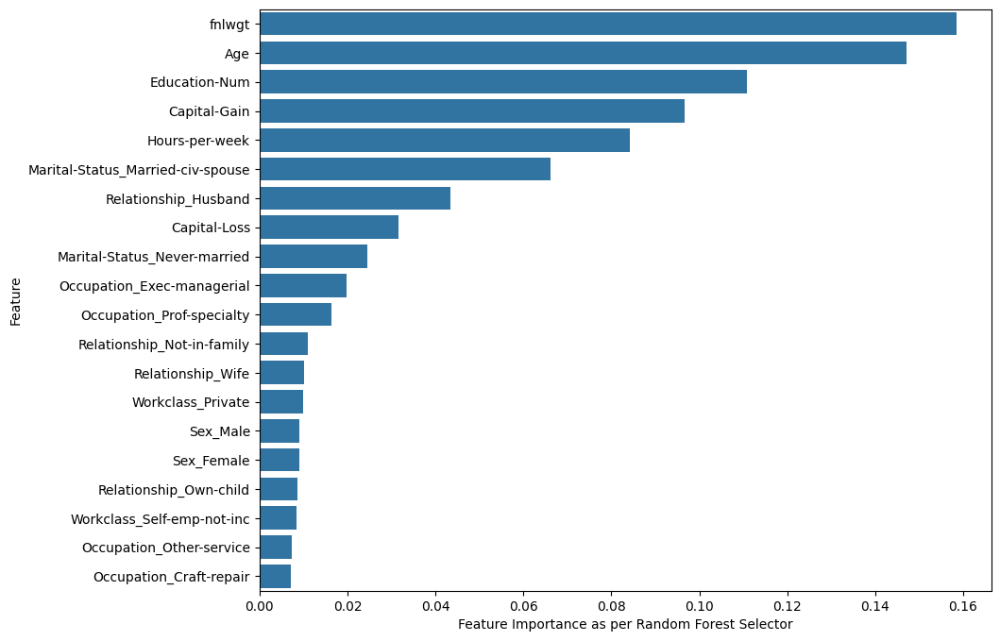

In [191]:
importances = rf_selector.feature_importances_
indices = np.argsort(importances)[::-1][:20]

# Create barplot
plt.figure(figsize=(10, 8))
ax = sns.barplot(x=importances[indices], y=[features[i] for i in indices])
ax.set_xlabel('Feature Importance as per Random Forest Selector')
ax.set_ylabel('Feature')
plt.show()

In [192]:
sfm = SelectFromModel(rf_selector)
sfm.fit(X_train, y_train)
features = X_train.columns
optimized_features = features[sfm.get_support()]
optimized_features

Index(['Age', 'fnlwgt', 'Education-Num', 'Capital-Gain', 'Capital-Loss',
       'Hours-per-week', 'Marital-Status_Married-civ-spouse',
       'Marital-Status_Never-married', 'Occupation_Exec-managerial',
       'Occupation_Prof-specialty', 'Relationship_Husband',
       'Relationship_Not-in-family'],
      dtype='object')

# Modelling

In [193]:
scoring = {
           'Balanced Accuracy':'balanced_accuracy',
            'Accuracy':'accuracy',
           'f1': 'f1'
}

In [194]:
et = ExtraTreesClassifier()
ab = AdaBoostClassifier()
xgb = xgboost.XGBClassifier()

# et.fit(X_train[optimized_features],y_train)
params = {
        'n_estimators': range(50,126,25),
    }
print('ET Grid Search started')
et_gridsearch = GridSearchCV(estimator=et,param_grid=params, scoring='balanced_accuracy', cv=15, n_jobs = -1)
et_gridsearch.fit(X_train[optimized_features],y_train)

print('AB Grid Search started')
ab_gridsearch = GridSearchCV(estimator=ab,param_grid=params, scoring='balanced_accuracy', cv=15, n_jobs = -1)
ab_gridsearch.fit(X_train[optimized_features],y_train)

print('XGB declared')
xgb = xgboost.XGBClassifier(n_estimators= 100, alpha = 0.15)
xgb.fit(X_train[optimized_features],y_train)



cv = ShuffleSplit(n_splits = 50, random_state = 0)

cv_et = cross_validate(et_gridsearch.best_estimator_,X_train[optimized_features], y_train, scoring = scoring, cv = cv, n_jobs = -1 )
print('ET cross validation done')

cv_ab = cross_validate(ab_gridsearch.best_estimator_,X_train[optimized_features], y_train, scoring = scoring, cv = cv, n_jobs = -1 )
print('AB cross validation done')

cv_xgb = cross_validate(xgb, X_train[optimized_features], y_train, scoring = scoring , cv = cv, n_jobs = -1 )
print('XGB cross validation done')

ET Grid Search started
AB Grid Search started
XGB declared
ET cross validation done
AB cross validation done
XGB cross validation done


# Cross Validation Results

In [195]:
cv_results = {'ET':cv_et,'AB':cv_ab, 'XGB':cv_xgb}
cvdf = pd.DataFrame.from_dict(cv_results
)
cvdf = cvdf[2:].applymap(np.mean)
cvdf.style.background_gradient(cmap = 'Pastel1', axis = 1,low=0.75, high=1).highlight_max(axis = 1).set_precision(3)

<ipython-input-195-1e351777be9b>:5: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  cvdf.style.background_gradient(cmap = 'Pastel1', axis = 1,low=0.75, high=1).highlight_max(axis = 1).set_precision(3)


,ET,AB,XGB
test_Balanced Accuracy,0.759,0.772,0.786
test_Accuracy,0.833,0.858,0.862
test_f1,0.644,0.676,0.694


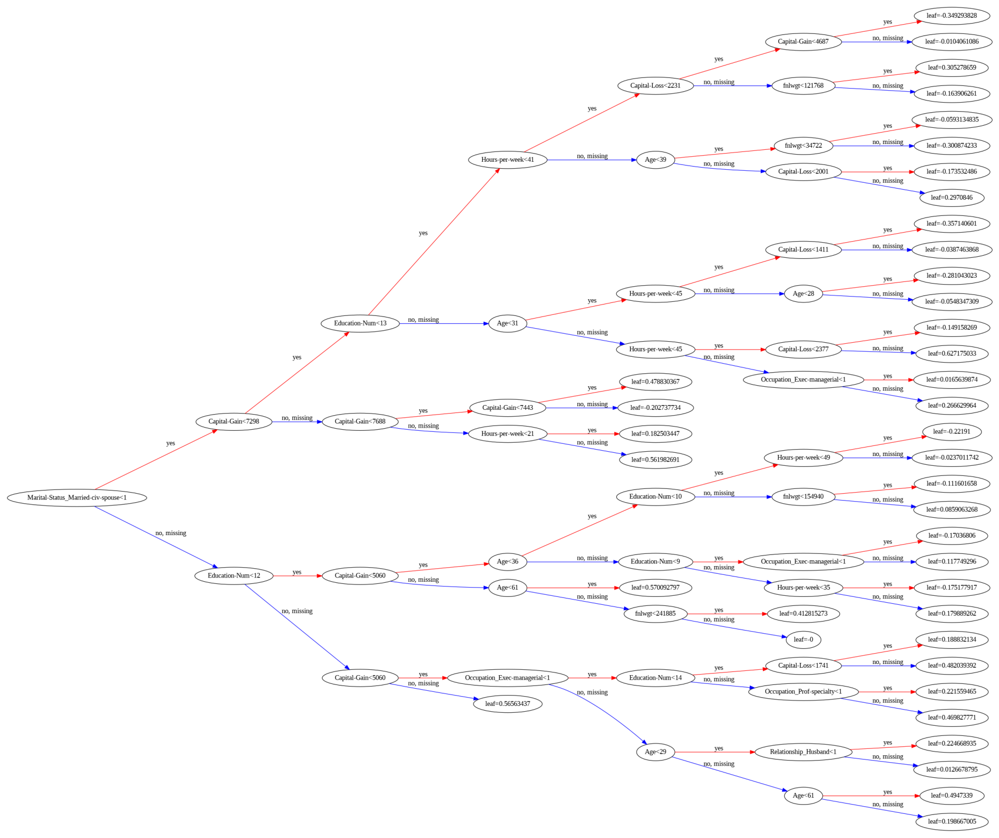

In [196]:
xgboost.plot_tree(xgb,num_trees=1, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(40,20)

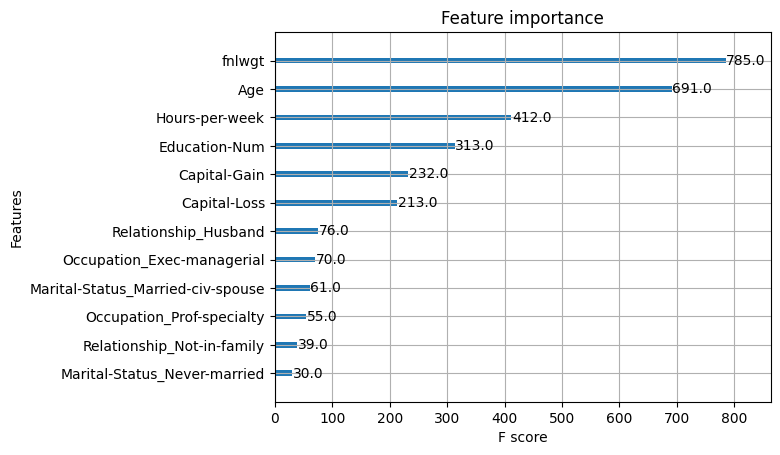

<Figure size 1600x1200 with 0 Axes>

In [197]:
xgboost.plot_importance(xgb)
plt.figure(figsize = (16, 12))
plt.show()

# Test Preprocessing

In [198]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26048 entries, 20671 to 16081
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             26048 non-null  int64 
 1   Workclass       26048 non-null  object
 2   fnlwgt          26048 non-null  int64 
 3   Education       26048 non-null  object
 4   Education-Num   26048 non-null  int64 
 5   Marital-Status  26048 non-null  object
 6   Occupation      26048 non-null  object
 7   Relationship    26048 non-null  object
 8   Race            26048 non-null  object
 9   Sex             26048 non-null  object
 10  Capital-Gain    26048 non-null  int64 
 11  Capital-Loss    26048 non-null  int64 
 12  Hours-per-week  26048 non-null  int64 
 13  Country         26048 non-null  object
 14  Target          26048 non-null  int64 
dtypes: int64(7), object(8)
memory usage: 3.2+ MB


In [199]:
different_dtype_cols = {}

for col in train.columns:
    if col!='Target' and test[col].dtype != train[col].dtype:
        different_dtype_cols[col] = train[col].dtype.name
        print(col,train[col].dtype,test[col].dtype)

In [200]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6513 entries, 14160 to 24639
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             6513 non-null   int64 
 1   Workclass       6513 non-null   object
 2   fnlwgt          6513 non-null   int64 
 3   Education       6513 non-null   object
 4   Education-Num   6513 non-null   int64 
 5   Marital-Status  6513 non-null   object
 6   Occupation      6513 non-null   object
 7   Relationship    6513 non-null   object
 8   Race            6513 non-null   object
 9   Sex             6513 non-null   object
 10  Capital-Gain    6513 non-null   int64 
 11  Capital-Loss    6513 non-null   int64 
 12  Hours-per-week  6513 non-null   int64 
 13  Country         6513 non-null   object
 14  Target          6513 non-null   object
dtypes: int64(6), object(9)
memory usage: 814.1+ KB


In [201]:
different_dtype_cols

{}

In [202]:
test = test[1:].astype(different_dtype_cols)

In [203]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6512 entries, 27048 to 24639
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             6512 non-null   int64 
 1   Workclass       6512 non-null   object
 2   fnlwgt          6512 non-null   int64 
 3   Education       6512 non-null   object
 4   Education-Num   6512 non-null   int64 
 5   Marital-Status  6512 non-null   object
 6   Occupation      6512 non-null   object
 7   Relationship    6512 non-null   object
 8   Race            6512 non-null   object
 9   Sex             6512 non-null   object
 10  Capital-Gain    6512 non-null   int64 
 11  Capital-Loss    6512 non-null   int64 
 12  Hours-per-week  6512 non-null   int64 
 13  Country         6512 non-null   object
 14  Target          6512 non-null   object
dtypes: int64(6), object(9)
memory usage: 814.0+ KB


In [204]:
def preprocessing(test_dataframe):
    test_dataframe = test_dataframe.fillna(0)
    test_dataframe = pd.get_dummies(test_dataframe,columns = ['Marital-Status','Occupation','Relationship','Workclass','Country','Race','Sex'],drop_first=False)
    test_dataframe['Target']= label_encoder.fit_transform(test_dataframe['Target'])
    X = test_dataframe.drop(['Target','Education'],axis =1)
    y = test_dataframe['Target'].values
    return test_dataframe

In [205]:
test_dataframe = preprocessing(test)

In [206]:
test_dataframe

,Age,fnlwgt,Education,Education-Num,Capital-Gain,Capital-Loss,Hours-per-week,Target,Marital-Status_Divorced,Marital-Status_Married-AF-spouse,...,Country_United-States,Country_Vietnam,Country_Yugoslavia,Race_Amer-Indian-Eskimo,Race_Asian-Pac-Islander,Race_Black,Race_Other,Race_White,Sex_Female,Sex_Male
27048,45,50567,HS-grad,9,0,0,40,0,0,0,...,1,0,0,0,0,0,0,1,1,0
28868,29,185908,Bachelors,13,0,0,55,1,0,0,...,1,0,0,0,0,1,0,0,0,1
5667,30,190040,Bachelors,13,0,0,40,0,0,0,...,1,0,0,0,0,0,0,1,1,0
7827,29,189346,Some-college,10,2202,0,50,0,1,0,...,1,0,0,0,0,0,0,1,0,1
15382,51,108435,Masters,14,0,0,47,1,0,0,...,1,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1338,71,269708,Bachelors,13,2329,0,16,0,1,0,...,1,0,0,0,0,0,0,1,1,0
24534,55,253062,Some-college,10,0,0,40,1,0,0,...,1,0,0,0,0,0,0,1,0,1
18080,47,354148,Prof-school,15,99999,0,48,1,0,0,...,1,0,0,0,0,0,0,1,0,1
10354,27,43652,Bachelors,13,0,0,40,0,0,0,...,1,0,0,0,0,0,0,1,1,0


# Evaluation on Test Adult Dataset

In [207]:
finalpredictions_xgb = xgb.predict(test_dataframe[optimized_features])
finalpredictions_xgb_prob = xgb.predict_proba(test_dataframe[optimized_features])[:, 1]

In [208]:
# compute and print accuracy score
print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(test_dataframe['Target'], finalpredictions_xgb)))

XGBoost model accuracy score: 0.8636


Text(0.5, 23.52222222222222, 'XGBOOST')

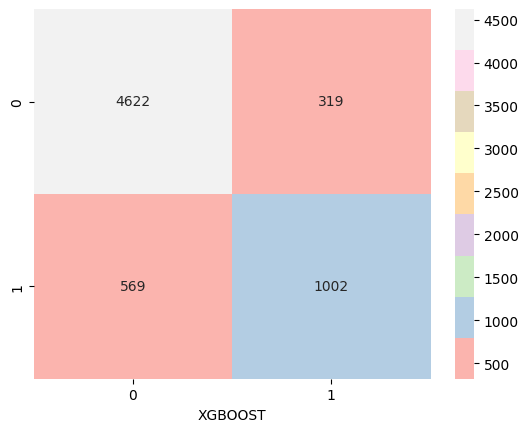

In [209]:
ax = sns.heatmap(confusion_matrix(test_dataframe['Target'], finalpredictions_xgb), annot=True,fmt="d",cmap = 'Pastel1')
ax.set_xlabel('XGBOOST')

In [210]:
print(classification_report(test_dataframe['Target'], finalpredictions_xgb))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91      4941
           1       0.76      0.64      0.69      1571

    accuracy                           0.86      6512
   macro avg       0.82      0.79      0.80      6512
weighted avg       0.86      0.86      0.86      6512



# Lime

In [211]:
# generate explainer object that can be used for explaining individual predictions
class_names = ['<=50K', '>50K']
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train[optimized_features]),feature_names=X_train[optimized_features].columns,class_names=class_names,
    mode='classification')

In [212]:
finalpredictions_xgb

array([0, 1, 0, ..., 1, 0, 0])

In [213]:
test_index = 1
instance = X_test[optimized_features].iloc[test_index]
print('Model prediction: ', class_names[finalpredictions_xgb[test_index]])
print(instance)


Model prediction:  >50K
Age                                      69
fnlwgt                               168794
Education-Num                             4
Capital-Gain                              0
Capital-Loss                              0
Hours-per-week                           48
Marital-Status_Married-civ-spouse         1
Marital-Status_Never-married              0
Occupation_Exec-managerial                0
Occupation_Prof-specialty                 0
Relationship_Husband                      1
Relationship_Not-in-family                0
Name: 21648, dtype: int64


In [214]:
print(test_dataframe[optimized_features].iloc[test_index])
print(finalpredictions_xgb_prob.shape[0:1])

Age                                      29
fnlwgt                               185908
Education-Num                            13
Capital-Gain                              0
Capital-Loss                              0
Hours-per-week                           55
Marital-Status_Married-civ-spouse         1
Marital-Status_Never-married              0
Occupation_Exec-managerial                1
Occupation_Prof-specialty                 0
Relationship_Husband                      1
Relationship_Not-in-family                0
Name: 28868, dtype: int64
(6512,)


In [215]:
type(X_train[optimized_features])

pandas.core.frame.DataFrame

In [216]:
type(xgb.predict_proba(test_dataframe[optimized_features])[:, 1])

numpy.ndarray

In [217]:
y_test_df = pd.DataFrame(y_test, columns=["Target"])
y_test_df

,Target
0,0
1,0
2,0
3,0
4,0
...,...
5205,0
5206,1
5207,1
5208,0


In [218]:
exp = explainer.explain_instance(
    data_row=test_dataframe[optimized_features].iloc[test_index],
    predict_fn=xgb.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[finalpredictions_xgb[test_index]])
print('True label: ', class_names[y_test_df.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[finalpredictions_xgb[test_index]])

exp.show_in_notebook(show_table=True)

Model prediction:  >50K
True label:  <=50K
LIME prediction:  >50K


In [219]:
# Another instance
test_index = 3
exp = explainer.explain_instance(
    data_row=test_dataframe[optimized_features].iloc[test_index],
    predict_fn=xgb.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[finalpredictions_xgb[test_index]])
print('True label: ', class_names[y_test_df.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[finalpredictions_xgb[test_index]])

exp.show_in_notebook(show_table=True)

Model prediction:  <=50K
True label:  <=50K
LIME prediction:  <=50K


# Shap

In [220]:
shap.initjs()
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(test_dataframe[optimized_features])

In [221]:
type(test_dataframe[optimized_features])

pandas.core.frame.DataFrame

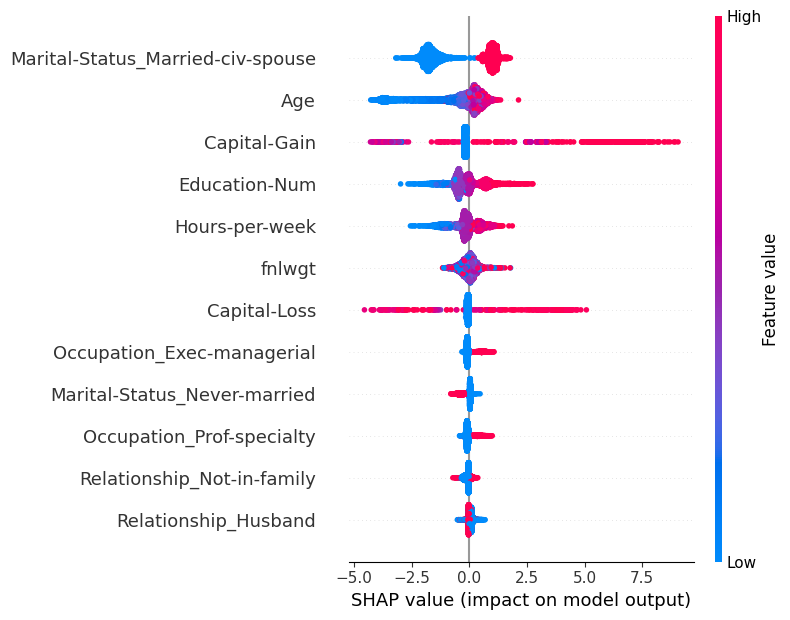

In [222]:
plt.figure()
shap.summary_plot(shap_values, test_dataframe[optimized_features])

In [223]:
shap.initjs()
shap.plots.force(test_dataframe['Target'].iloc[0],shap_values[0])

In [224]:
# Choose a test instance
index = 15
instance = test_dataframe[optimized_features].iloc[index]

# Print the instance
print(instance)
print("Prediction probability: " , xgb.predict_proba(instance.values.reshape(1, -1))[0][1])

Age                                     43
fnlwgt                               99212
Education-Num                           11
Capital-Gain                          3103
Capital-Loss                             0
Hours-per-week                          48
Marital-Status_Married-civ-spouse        1
Marital-Status_Never-married             0
Occupation_Exec-managerial               1
Occupation_Prof-specialty                0
Relationship_Husband                     1
Relationship_Not-in-family               0
Name: 8966, dtype: int64
Prediction probability:  0.9869266


In [225]:
type(instance)

pandas.core.series.Series

In [226]:
instance.to_frame().transpose()

,Age,fnlwgt,Education-Num,Capital-Gain,Capital-Loss,Hours-per-week,Marital-Status_Married-civ-spouse,Marital-Status_Never-married,Occupation_Exec-managerial,Occupation_Prof-specialty,Relationship_Husband,Relationship_Not-in-family
8966,43,99212,11,3103,0,48,1,0,1,0,1,0


In [227]:
shap_values = explainer.shap_values(instance.to_frame().transpose())
print("SHAP values for instance:", shap_values[0].round(5))
print("Sum of SHAP values:", shap_values[0].sum().round(5))
print("Expected value:", explainer.expected_value.round(5))
print("Sum of SHAP values and expected value:", (explainer.expected_value + shap_values[0].sum()).round(5))

SHAP values for instance: [ 0.09652  0.30661  0.05694  2.90097 -0.09147  0.44925  1.07383  0.04522
  0.84743 -0.0072  -0.02824 -0.03664]
Sum of SHAP values: 5.61323
Expected value: -1.28921
Sum of SHAP values and expected value: 4.32402


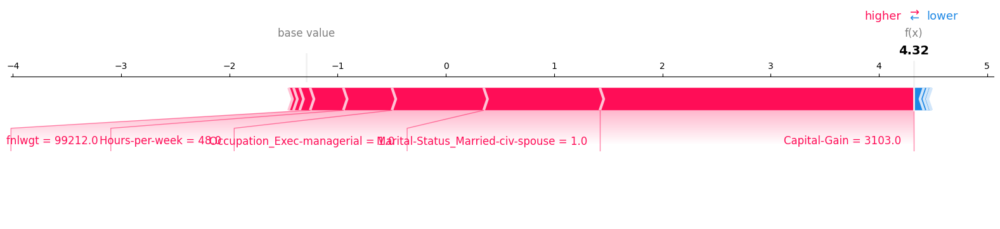

In [228]:
# To create Shapley values visualisations
shap.initjs()

shap.force_plot(explainer.expected_value, shap_values[0], instance,matplotlib=plt)

## Compute predicitons and shap values for complete test dataset

In [229]:
test_shap_values = explainer.shap_values(test_dataframe[optimized_features])

In [230]:
test_shap_values[0:100].shape

(100, 12)

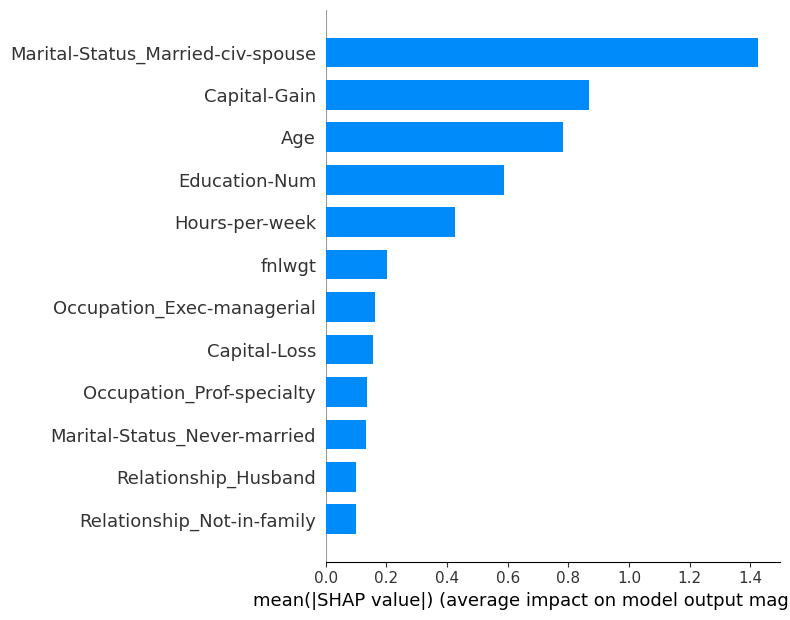

In [231]:
# Summary plot for the first 100 test instances
shap.summary_plot(test_shap_values[0:100], test_dataframe[optimized_features].iloc[0:100,:], plot_type="bar")

In [232]:
# Force plot for the first 100 test instances
# To create Shapley values visualisations
shap.initjs()

shap.force_plot(explainer.expected_value, test_shap_values[0:100], test_dataframe[optimized_features].iloc[0:100,:])

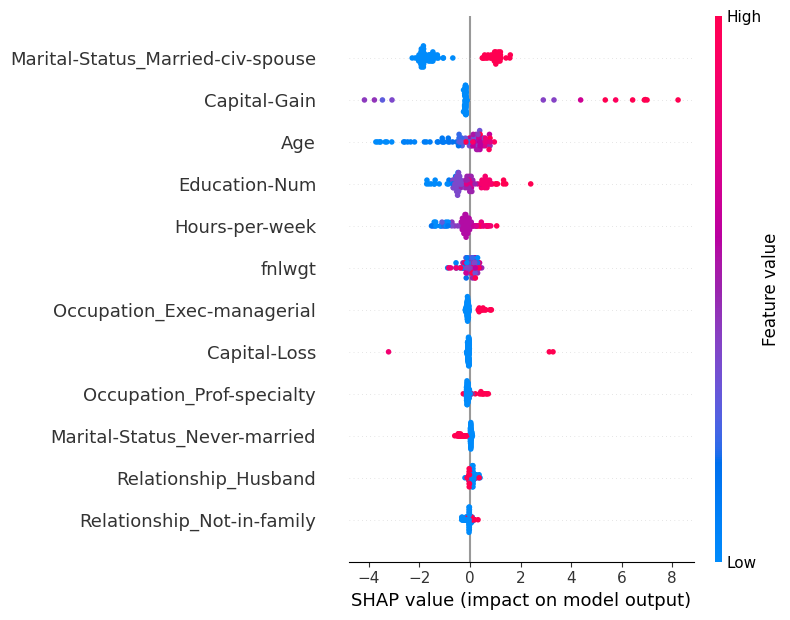

In [233]:
# Summary plot for the first 100 test instances
shap.summary_plot(test_shap_values[0:100], test_dataframe[optimized_features].iloc[0:100,:])

# Census income Classification using Shap - from Docs

In [234]:
import matplotlib.pylab as pl
import numpy as np
import xgboost
from sklearn.model_selection import train_test_split

import shap

# print the JS visualization code to the notebook
shap.initjs()

In [235]:
X, y = shap.datasets.adult()
X_display, y_display = shap.datasets.adult(display=True)

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
d_train = xgboost.DMatrix(X_train, label=y_train)
d_test = xgboost.DMatrix(X_test, label=y_test)

In [236]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(y_train),
    "eval_metric": "logloss",
}
model = xgboost.train(
    params,
    d_train,
    5000,
    evals=[(d_test, "test")],
    verbose_eval=100,
    early_stopping_rounds=20,
)

[0]	test-logloss:0.54663
[100]	test-logloss:0.36398
[200]	test-logloss:0.31758
[300]	test-logloss:0.30065
[400]	test-logloss:0.29170
[500]	test-logloss:0.28655
[600]	test-logloss:0.28358
[700]	test-logloss:0.28174
[800]	test-logloss:0.28061
[900]	test-logloss:0.27988
[1000]	test-logloss:0.27939
[1100]	test-logloss:0.27906
[1178]	test-logloss:0.27887


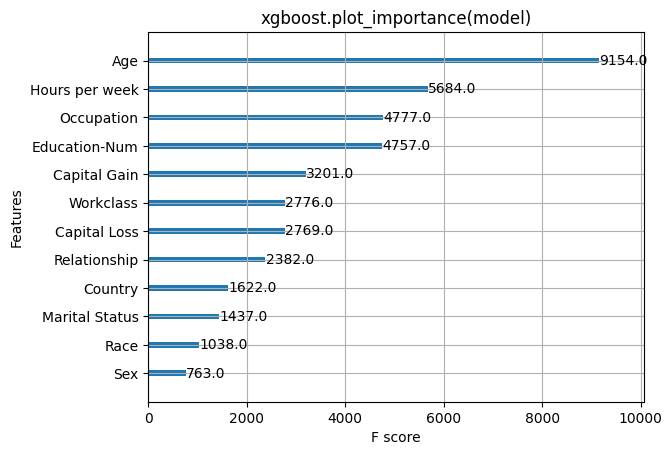

In [237]:
xgboost.plot_importance(model)
pl.title("xgboost.plot_importance(model)")
pl.show()

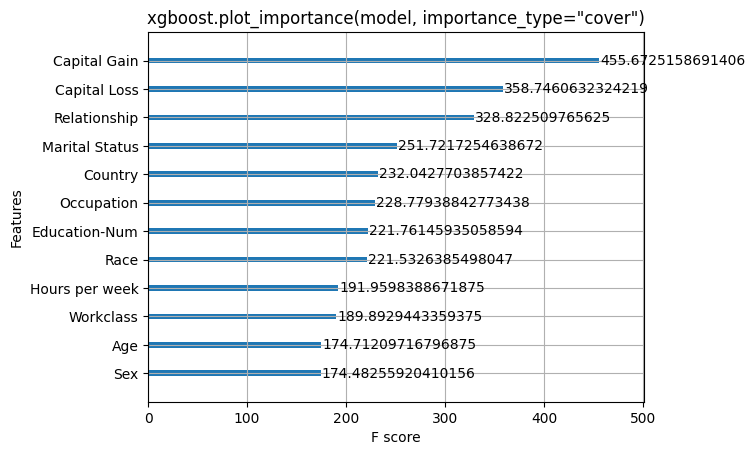

In [238]:
xgboost.plot_importance(model, importance_type="cover")
pl.title('xgboost.plot_importance(model, importance_type="cover")')
pl.show()

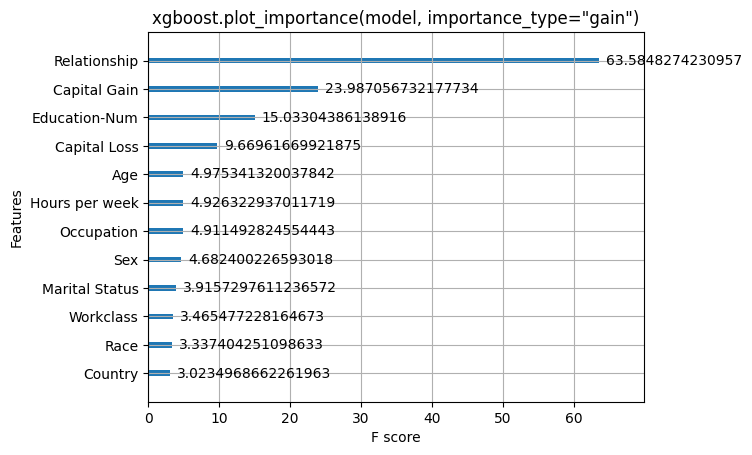

In [239]:
xgboost.plot_importance(model, importance_type="gain")
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

In [240]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [241]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0, :], X_display.iloc[0, :])

In [242]:
shap.initjs()
shap.force_plot(
    explainer.expected_value, shap_values[:100, :], X_display.iloc[:100, :]
)

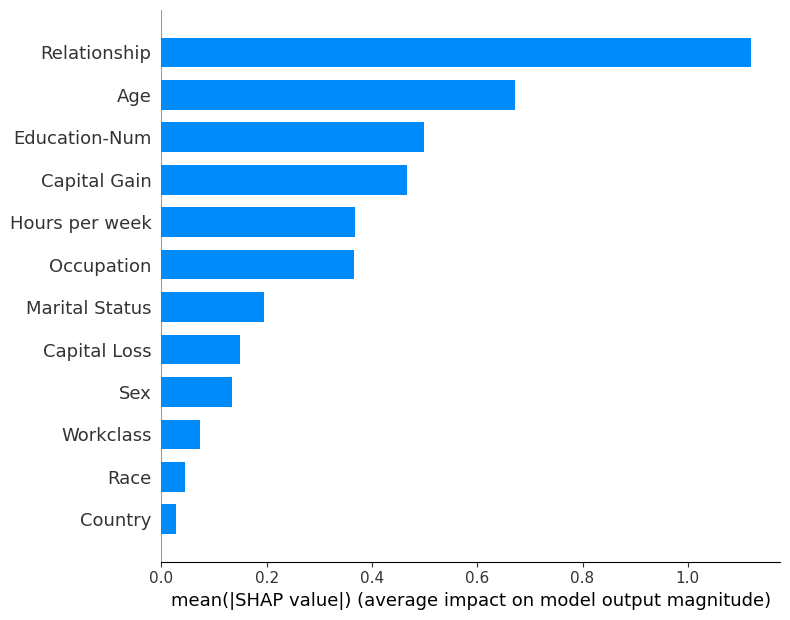

In [243]:
# Takes the average of the SHAP value magnitudes across the dataset
shap.summary_plot(shap_values, X_display, plot_type="bar")

## Shap Summary Plot

Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

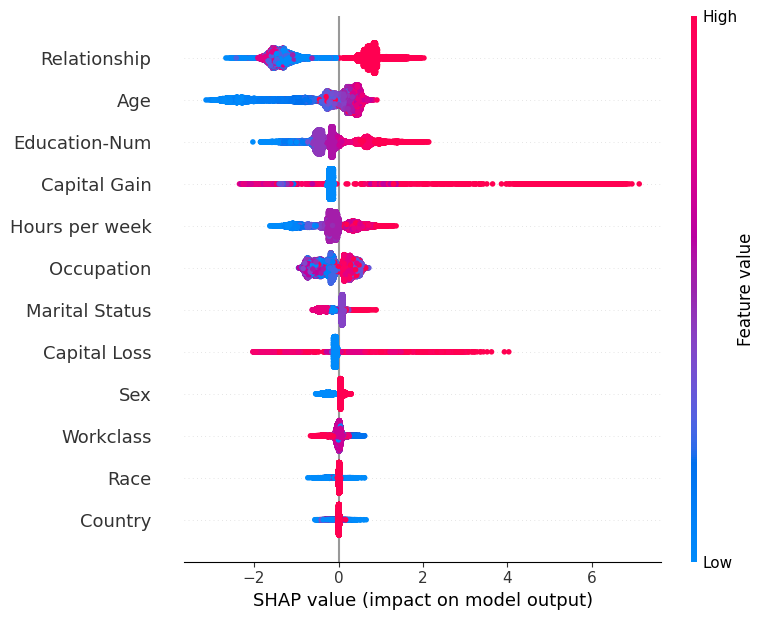

In [244]:
shap.summary_plot(shap_values, X)

## Shap Dependence Plots

SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature’s value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

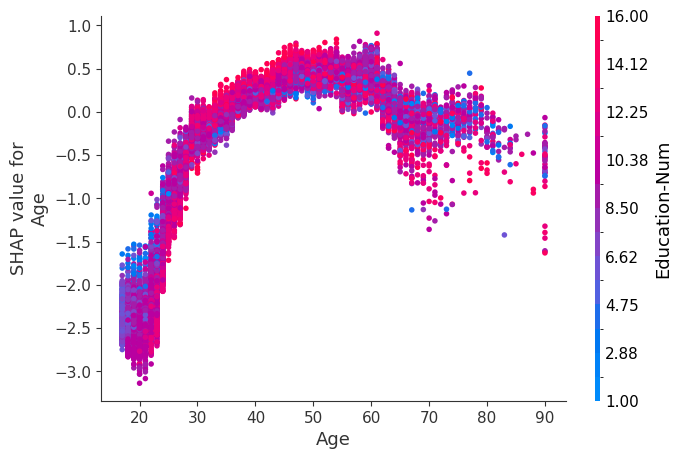

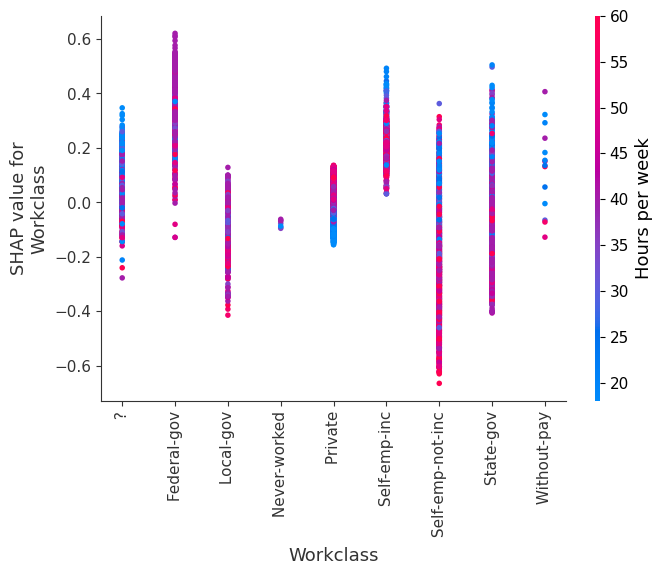

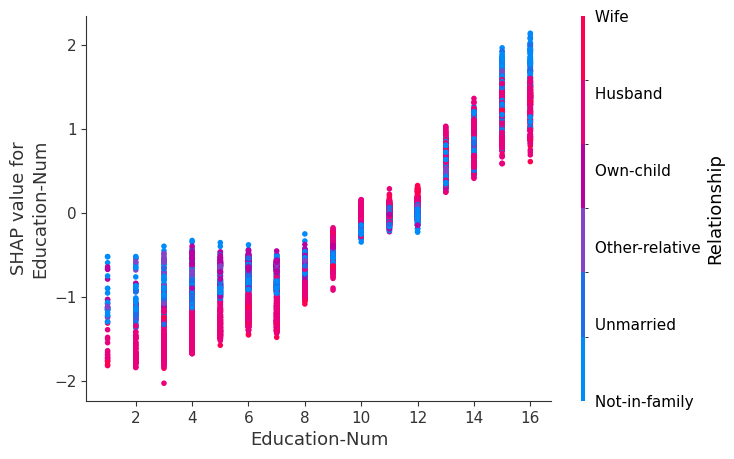

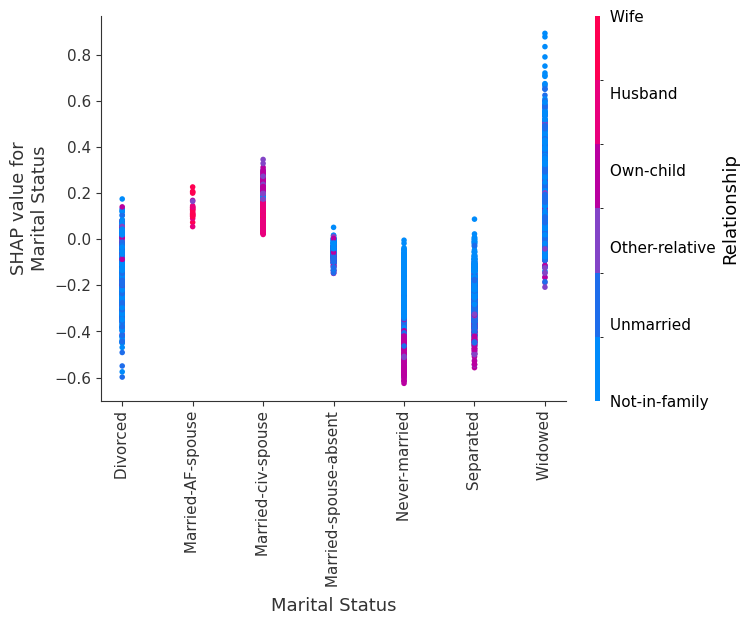

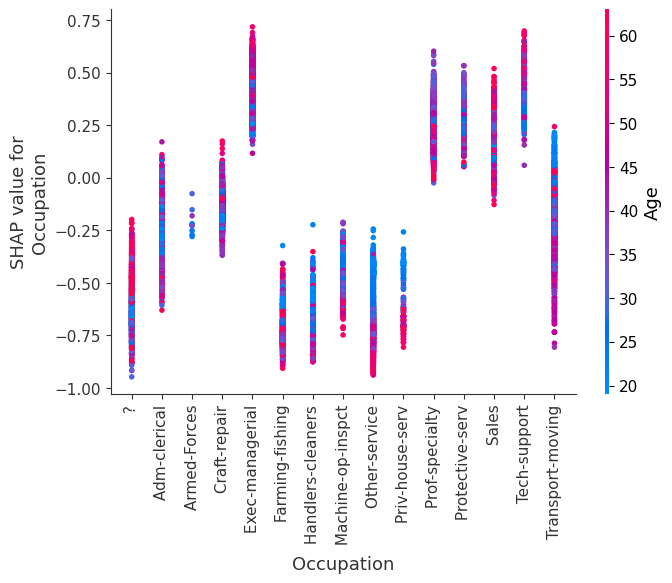

...

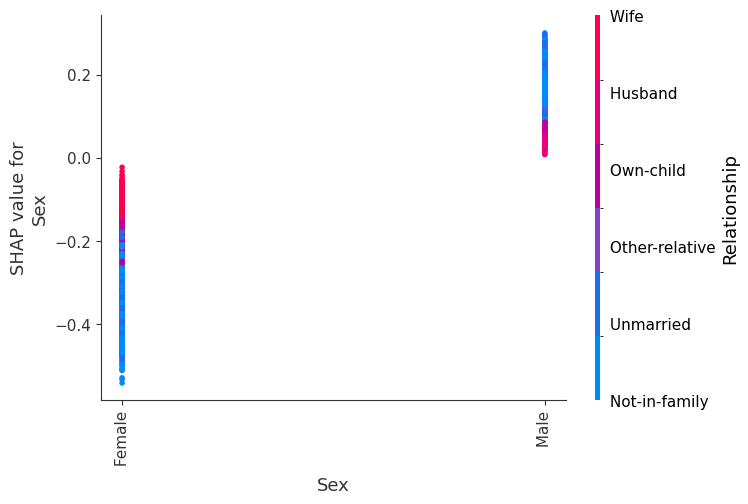

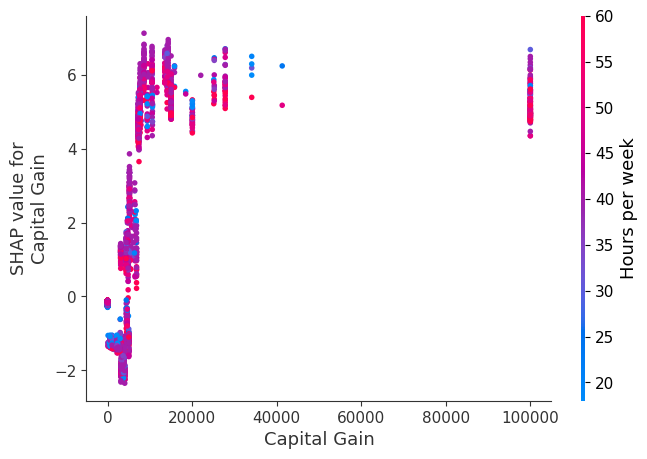

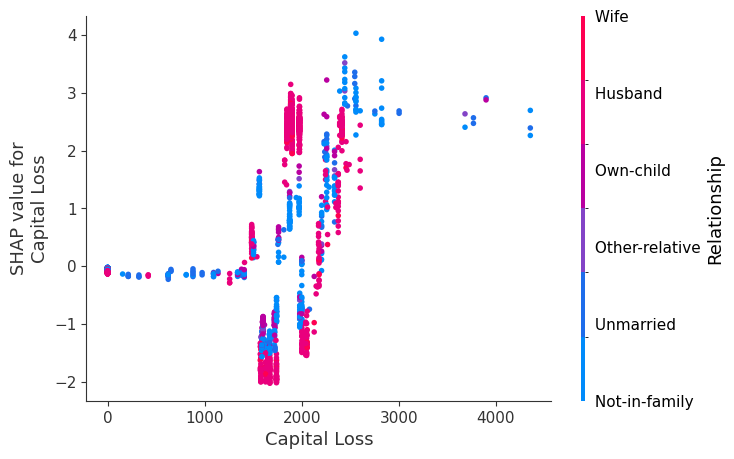

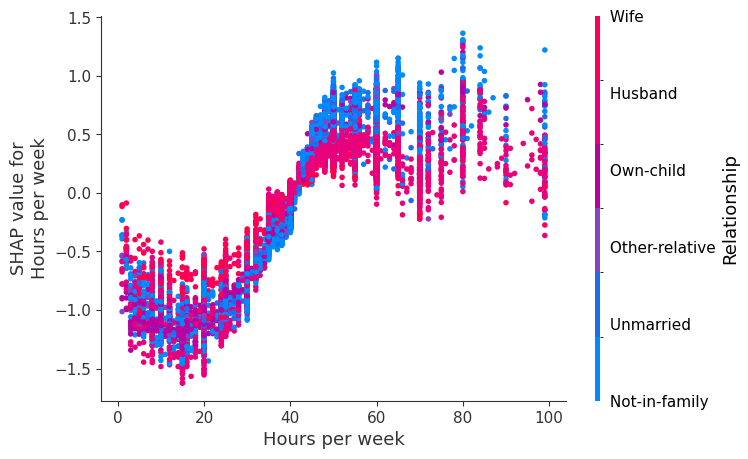

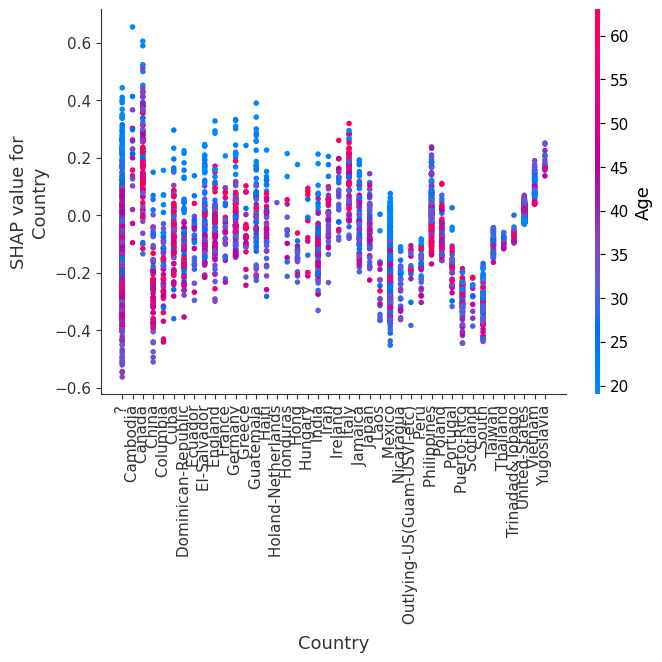

In [245]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X, display_features=X_display)

## Simple supervised clustering

In [246]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

shap_pca50 = PCA(n_components=12).fit_transform(shap_values[:1000, :])
shap_embedded = TSNE(n_components=2, perplexity=50).fit_transform(shap_values[:1000, :])

In [247]:
from matplotlib.colors import LinearSegmentedColormap

cdict1 = {
    "red": (
        (0.0, 0.11764705882352941, 0.11764705882352941),
        (1.0, 0.9607843137254902, 0.9607843137254902),
    ),
    "green": (
        (0.0, 0.5333333333333333, 0.5333333333333333),
        (1.0, 0.15294117647058825, 0.15294117647058825),
    ),
    "blue": (
        (0.0, 0.8980392156862745, 0.8980392156862745),
        (1.0, 0.3411764705882353, 0.3411764705882353),
    ),
    "alpha": ((0.0, 1, 1), (0.5, 1, 1), (1.0, 1, 1)),
}  # #1E88E5 -> #ff0052
red_blue_solid = LinearSegmentedColormap("RedBlue", cdict1)

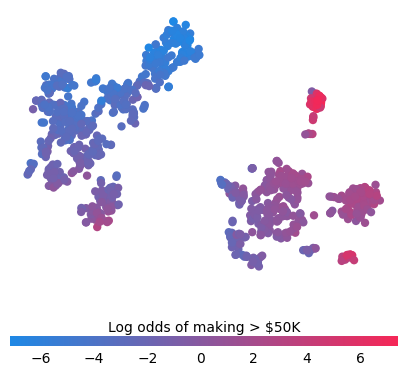

In [248]:
f = pl.figure(figsize=(5, 5))
pl.scatter(
    shap_embedded[:, 0],
    shap_embedded[:, 1],
    c=shap_values[:1000, :].sum(1).astype(np.float64),
    linewidth=0,
    alpha=1.0,
    cmap=red_blue_solid,
)
cb = pl.colorbar(label="Log odds of making > $50K", aspect=40, orientation="horizontal")
cb.set_alpha(1)
cb.outline.set_linewidth(0)
cb.ax.tick_params("x", length=0)
cb.ax.xaxis.set_label_position("top")
pl.gca().axis("off")
pl.show()

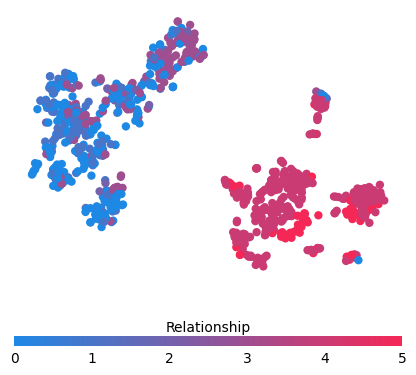

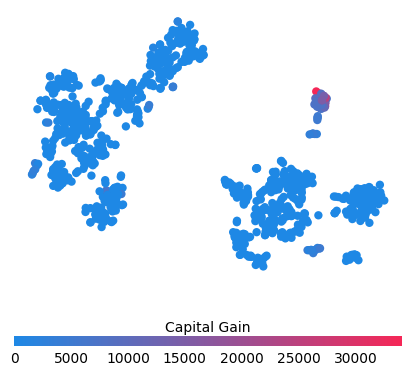

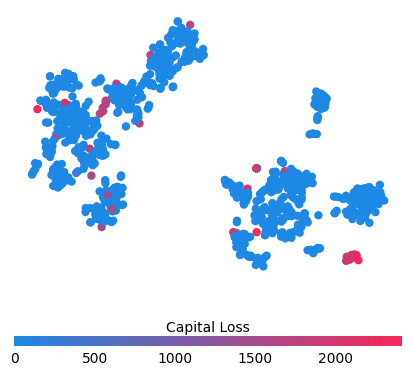

In [249]:
for feature in ["Relationship", "Capital Gain", "Capital Loss"]:
    f = pl.figure(figsize=(5, 5))
    pl.scatter(
        shap_embedded[:, 0],
        shap_embedded[:, 1],
        c=X[feature].values[:1000].astype(np.float64),
        linewidth=0,
        alpha=1.0,
        cmap=red_blue_solid,
    )
    cb = pl.colorbar(label=feature, aspect=40, orientation="horizontal")
    cb.set_alpha(1)
    cb.outline.set_linewidth(0)
    cb.ax.tick_params("x", length=0)
    cb.ax.xaxis.set_label_position("top")
    pl.gca().axis("off")
    pl.show()

# Lime for new model

In [250]:
import xgboost as xgb2
X, y = shap.datasets.adult()
X_display, y_display = shap.datasets.adult(display=True)

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

xgb_clf = xgb2.XGBClassifier()
xgb_clf = xgb_clf.fit(X_train, y_train)

pred = xgb_clf.predict(X_test)
pred_probs = xgb_clf.predict_proba(X_test)

print(xgb_clf.predict(X_test))
print(xgb_clf.predict_proba(X_test))

[0 1 0 ... 0 0 0]
[[9.7046596e-01 2.9534068e-02]
 [1.8447417e-01 8.1552583e-01]
 [9.6280515e-01 3.7194841e-02]
 ...
 [9.9997234e-01 2.7635104e-05]
 [9.9913895e-01 8.6107088e-04]
 [5.2939689e-01 4.7060314e-01]]


In [251]:
# generate explainer object that can be used for explaining individual predictions
class_names = ['<=50K', '>50K']
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train),feature_names=X_train.columns,class_names=class_names,
    mode='classification')

In [252]:
# predictions = model.predict(d_test)
# predictions = (predictions > 0.5).astype(int)
# predictions

In [253]:
test_index = 1
instance = X_test.iloc[test_index]
print('Model prediction: ', class_names[pred[test_index]])
print(instance)


Model prediction:  >50K
Age               48.0
Workclass          1.0
Education-Num     13.0
Marital Status     0.0
Occupation         4.0
Relationship       1.0
Race               4.0
Sex                1.0
Capital Gain       0.0
Capital Loss       0.0
Hours per week    58.0
Country           39.0
Name: 997, dtype: float64


In [254]:
y_test_df_xgb = pd.DataFrame(y_test, columns=["Target"])
y_test_df_xgb

,Target
0,False
1,True
2,False
3,False
4,False
...,...
6508,False
6509,False
6510,False
6511,False


In [255]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[test_index],
    predict_fn=xgb_clf.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[pred[test_index]])
print('True label: ', class_names[y_test_df_xgb.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[pred[test_index]])

exp.show_in_notebook(show_table=True)

Model prediction:  >50K
True label:  >50K
LIME prediction:  >50K


<ipython-input-255-f4e4474aa300>:7: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  print('True label: ', class_names[y_test_df_xgb.iloc[test_index].values[0]])


In [256]:
# Another instance
test_index = 3
exp = explainer.explain_instance(
    data_row=X_test.iloc[test_index],
    predict_fn=xgb_clf.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[pred[test_index]])
print('True label: ', class_names[y_test_df_xgb.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[pred[test_index]])

exp.show_in_notebook(show_table=True)

Model prediction:  <=50K
True label:  <=50K
LIME prediction:  <=50K


<ipython-input-256-174a4d643e6e>:9: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  print('True label: ', class_names[y_test_df_xgb.iloc[test_index].values[0]])


# RandomForestClassifier Lime & SHAP

In [257]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.tree import plot_tree


In [258]:
# Set the path to the CSV containing the dataset to train on.
csv_path = 'https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data'

# Set the column names for the columns in the CSV. If the CSV's first line is a header line containing
# the column names, then set this to None.
csv_columns = [
  "Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital-Status",
  "Occupation", "Relationship", "Race", "Sex", "Capital-Gain", "Capital-Loss",
  "Hours-per-week", "Country", "Over-50K"]

# Read the dataset from the provided CSV and print out information about it.
df = pd.read_csv(csv_path, names=csv_columns, skipinitialspace=True)

df

,Age,Workclass,fnlwgt,Education,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country,Over-50K
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [259]:
categorical_features = ["Workclass", "Education", "Marital-Status", "Occupation", "Relationship", "Race", "Sex", "Country"]
category_mappings = {}
for feature in categorical_features:
    label_encoder = LabelEncoder()
    df[feature] = label_encoder.fit_transform(df[feature])
    category_mappings[feature] = {label: index for index, label in enumerate(label_encoder.classes_)}
df['Over-50K'] = df['Over-50K'].map({'<=50K': 0, '>50K': 1})

df.head()

,Age,Workclass,fnlwgt,Education,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country,Over-50K
0,39,7,77516,9,13,4,1,1,4,1,2174,0,40,39,0
1,50,6,83311,9,13,2,4,0,4,1,0,0,13,39,0
2,38,4,215646,11,9,0,6,1,4,1,0,0,40,39,0
3,53,4,234721,1,7,2,6,0,2,1,0,0,40,39,0
4,28,4,338409,9,13,2,10,5,2,0,0,0,40,5,0


In [260]:
columns_to_drop = ['fnlwgt', 'Education', 'Over-50K']

X_dropped = df.drop(columns_to_drop, axis=1)
y = df['Over-50K']
X_train_dropped, X_test_dropped, y_train, y_test = train_test_split(X_dropped, y, test_size=0.2, random_state=57)

clf_dropped = RandomForestClassifier(n_estimators=1000, max_depth=8, random_state=57)
clf_dropped.fit(X_train_dropped, y_train)

y_pred_dropped = clf_dropped.predict(X_test_dropped)

print(f"Accuracy: {accuracy_score(y_test, y_pred_dropped)}")
print(classification_report(y_test, y_pred_dropped))

Accuracy: 0.8567480423767849
              precision    recall  f1-score   support

           0       0.87      0.96      0.91      4952
           1       0.80      0.53      0.64      1561

    accuracy                           0.86      6513
   macro avg       0.84      0.75      0.78      6513
weighted avg       0.85      0.86      0.85      6513



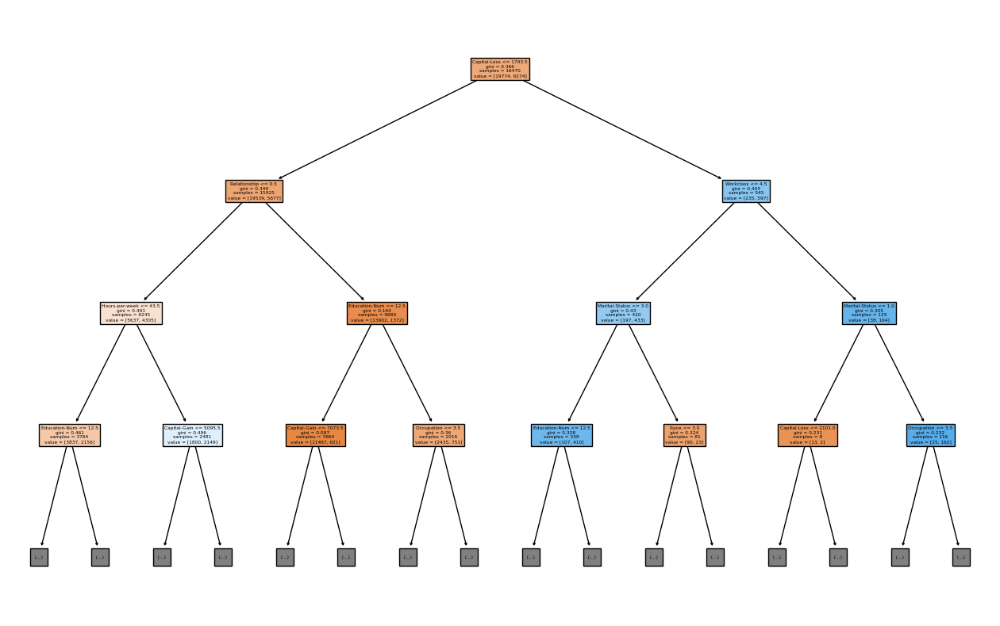

In [261]:
single_tree = clf_dropped.estimators_[0]

plt.figure(figsize=(16,10))
plot_tree(single_tree, feature_names=X_train_dropped.columns, filled=True, max_depth=3)
plt.show()

## Lime for Random Forest

In [262]:
# generate explainer object that can be used for explaining individual predictions
class_names = ['<=50K', '>50K']
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_dropped),feature_names=X_train_dropped.columns,class_names=class_names,
    mode='classification')

In [263]:
test_index = 1
instance = X_test_dropped.iloc[test_index]
print('Model prediction: ', class_names[y_pred_dropped[test_index]])
print(instance)

Model prediction:  <=50K
Age               46
Workclass          4
Education-Num     10
Marital-Status     2
Occupation         1
Relationship       0
Race               4
Sex                1
Capital-Gain       0
Capital-Loss       0
Hours-per-week    40
Country           39
Name: 31126, dtype: int64


In [264]:
y_test_df_rf = pd.DataFrame(y_test, columns=["Over-50K"])
y_test_df_rf

,Over-50K
20934,0
31126,1
7177,1
18854,0
10919,1
...,...
12758,1
11903,0
11661,0
19389,0


In [265]:
exp = explainer.explain_instance(
    data_row=X_test_dropped.iloc[test_index],
    predict_fn=clf_dropped.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[y_pred_dropped[test_index]])
print('True label: ', class_names[y_test_df_rf.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[y_pred_dropped[test_index]])

exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Model prediction:  <=50K
True label:  >50K
LIME prediction:  <=50K


In [266]:
test_index = 3
exp = explainer.explain_instance(
    data_row=X_test_dropped.iloc[test_index],
    predict_fn=clf_dropped.predict_proba #(test_dataframe[optimized_features])[:, 1]
)

print('Model prediction: ', class_names[y_pred_dropped[test_index]])
print('True label: ', class_names[y_test_df_rf.iloc[test_index].values[0]])
# check also LIME linear model predictions
top_labels = exp.available_labels()
print('LIME prediction: ', class_names[y_pred_dropped[test_index]])

exp.show_in_notebook(show_table=True)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Model prediction:  <=50K
True label:  <=50K
LIME prediction:  <=50K


## SHAP for RandomForest

In [267]:
shap.initjs()

# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer_rf = shap.TreeExplainer(clf_dropped)
shap_values = explainer_rf.shap_values(X_test_dropped)

In [268]:
shap_values.shape

(6513, 12, 2)

In [269]:
X_test_dropped

,Age,Workclass,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country
20934,29,4,10,4,8,1,2,0,0,0,30,23
31126,46,4,10,2,1,0,4,1,0,0,40,39
7177,38,4,10,5,7,1,4,1,0,2258,55,39
18854,36,4,2,6,8,2,4,0,0,0,20,26
10919,53,7,14,2,4,0,4,1,15024,0,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...
12758,47,4,14,2,1,5,4,0,7688,0,38,39
11903,34,4,9,4,3,4,4,1,2036,0,30,39
11661,41,7,14,4,1,1,2,0,0,0,40,39
19389,31,4,11,2,3,0,4,1,3464,0,38,39


In [270]:
print(X_test_dropped.iloc[: 100].shape)
print((shap_values[:100, :, 1].shape))

(100, 12)
(100, 12)


In [271]:
shap.initjs()
shap.force_plot(explainer_rf.expected_value[0], shap_values[0][:, 0], X_test_dropped.iloc[0, :])

In [272]:
explainer_rf.expected_value.shape

(2,)

In [279]:
shap.initjs()
shap.force_plot(
    explainer_rf.expected_value[0], shap_values[:100, :, 1], X_test_dropped.iloc[:100]
)

In [274]:
X_test_dropped

,Age,Workclass,Education-Num,Marital-Status,Occupation,Relationship,Race,Sex,Capital-Gain,Capital-Loss,Hours-per-week,Country
20934,29,4,10,4,8,1,2,0,0,0,30,23
31126,46,4,10,2,1,0,4,1,0,0,40,39
7177,38,4,10,5,7,1,4,1,0,2258,55,39
18854,36,4,2,6,8,2,4,0,0,0,20,26
10919,53,7,14,2,4,0,4,1,15024,0,38,39
...,...,...,...,...,...,...,...,...,...,...,...,...
12758,47,4,14,2,1,5,4,0,7688,0,38,39
11903,34,4,9,4,3,4,4,1,2036,0,30,39
11661,41,7,14,4,1,1,2,0,0,0,40,39
19389,31,4,11,2,3,0,4,1,3464,0,38,39


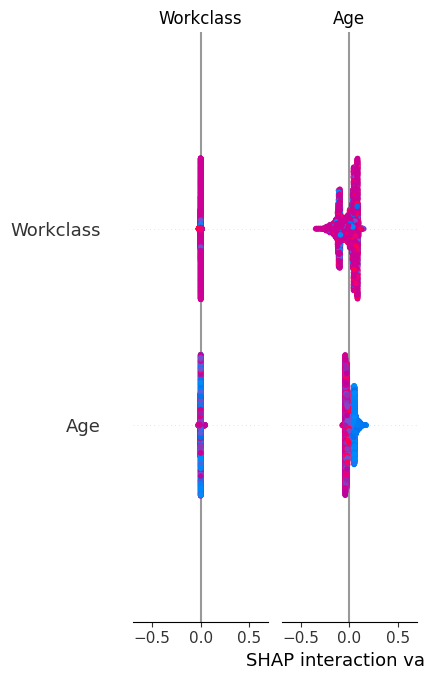

In [280]:
# Takes the average of the SHAP value magnitudes across the dataset
shap.summary_plot(shap_values, X_test_dropped,  plot_type="bar")

## SHAP Summary Plot RF
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

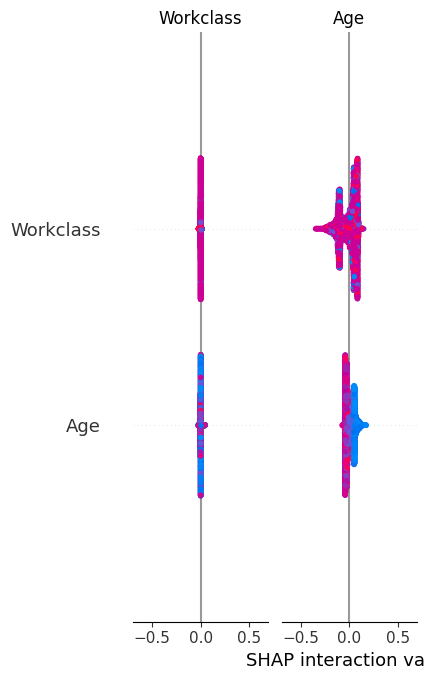

In [276]:
shap.summary_plot(shap_values, X_test_dropped)

## SHAP Dependence Plots RF
SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature’s value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

In [277]:
for name in X_train_dropped.columns:
    shap.dependence_plot(name, shap_values[0], X_test_dropped, display_features=X_test_dropped)

IndexError: index 12 is out of bounds for axis 0 with size 12

SHAP after upsampling using SMOTE

In [ ]:
# Upsampling using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_dropped, y)

In [ ]:
df_resampled = pd.concat([X_resampled, y_resampled], axis=1)

In [ ]:
X_train_resampled, X_test_resampled, y_train_resampled, y_test_resampled = train_test_split(X_dropped, y, test_size=0.2)

In [ ]:
clf_resampled = RandomForestClassifier(n_estimators=1000, max_depth=8, random_state=57)
clf_resampled.fit(X_train_resampled, y_train_resampled)

y_pred_resampled = clf_resampled.predict(X_test_resampled)

print(f"Accuracy: {accuracy_score(y_test_resampled, y_pred_resampled)}")
print(classification_report(y_test_resampled, y_pred_resampled))

In [ ]:
shap.initjs()

# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer_rf = shap.TreeExplainer(clf_resampled)
shap_values = explainer_rf.shap_values(X_test_resampled)

In [ ]:
shap.summary_plot(shap_values, X_resampled)

In [ ]:
for name in X_train_resampled.columns:
    shap.dependence_plot(name, shap_values[0], X_test_resampled, display_features=X_test_resampled)

Identifying Proxy Variables using FACET

In [ ]:
!pip install gamma-facet
!pip install sklearndf
!pip install pytools

from pytools.viz.matrix import MatrixDrawer
from pytools.viz.dendrogram import DendrogramDrawer

from sklearn.model_selection import RepeatedKFold, GridSearchCV

from facet.data import Sample
from facet.selection import LearnerSelector, ParameterSpace

from sklearndf.pipeline import (
    PipelineDF,
    ClassifierPipelineDF,
)
from sklearndf.classification import RandomForestClassifierDF

In [ ]:
df_train_sample = df_resampled.sample(n=10000)

data_sample = Sample(observations=df_train_sample, target_name="Over-50K")

# create a (trivial) pipeline for a random forest regressor
rnd_forest_clf = ClassifierPipelineDF(
    classifier=RandomForestClassifierDF(n_estimators=50, random_state=42)
)

# define parameter space for models which are "competing" against each other
rnd_forest_ps = ParameterSpace(rnd_forest_clf)
rnd_forest_ps.classifier.min_samples_leaf = [8]
rnd_forest_ps.classifier.max_depth = [8]

# create repeated k-fold CV iterator
rkf_cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=42)

# rank your candidate models by performance
selector = LearnerSelector(
    searcher_type=GridSearchCV,
    parameter_space=rnd_forest_ps,
    cv=rkf_cv,
    n_jobs=-3,
    scoring="roc_auc"
).fit(data_sample)

# get summary report
selector.summary_report()

In [ ]:
# fit the model inspector
from facet.inspection import LearnerInspector
inspector = LearnerInspector(
    model=selector.best_estimator_,
    shap_interaction=True
)

In [ ]:
inspector.fit(data_sample)

In [ ]:
# Synergy Matrix
synergy_matrix = inspector.feature_synergy_matrix()
plt.rcParams["figure.figsize"] = (16, 12)
MatrixDrawer(style="matplot%").draw(synergy_matrix, title="Synergy Matrix")

In [ ]:
# visualise redundancy as a matrix
redundancy_matrix = inspector.feature_redundancy_matrix()
plt.rcParams["figure.figsize"] = (14, 10)
MatrixDrawer(style="matplot%").draw(redundancy_matrix, title="Redundancy Matrix")

In [ ]:
# visualise redundancy using a dendrogram
redundancy = inspector.feature_redundancy_linkage()
plt.rcParams["figure.figsize"] = (16, 12)
DendrogramDrawer().draw(data=redundancy, title="Redundancy Dendrogram")